# scRNA Seurat

Dim reduction, UMAP etc.

In [1]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(patchwork)
library(Matrix)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
DAYS = c("D1M", "D2M")

## Load Data

In [3]:
# aggregated cellranger data
rna.data = Read10X("/srv/scratch/surag/scMultiome-reprog/rna_process/cellranger/aggregate_nonorm/outs/count/filtered_feature_bc_matrix")

In [4]:
rna = CreateSeuratObject(counts = rna.data, project = "scMultiome-reprog", min.cells = 3, min.features = 200)

In [5]:
rna

An object of class Seurat 
31452 features across 16914 samples within 1 assay 
Active assay: RNA (31452 features, 0 variable features)

In [6]:
rna[["sample"]] = DAYS[as.numeric(lapply(strsplit(colnames(rna), "-"), "[[", 2))] 

In [7]:
table(rna@meta.data$sample)


  D1M   D2M 
 6716 10198 

In [16]:
barcodes = c(paste(as.character(read.table("./barcodes/20220607_nFeat200_mt15_oskm0.5_nCount2000_doub15_pk0.01_atac_filt/D1M.tsv")$V2), "1", sep='-'),
             paste(as.character(read.table("./barcodes/20220607_nFeat200_mt15_oskm0.5_nCount2000_doub15_pk0.01_atac_filt/D2M.tsv")$V2), "2", sep='-'))

In [17]:
sample(barcodes, 4)

[1] "CAGGCTATCAGCAAGA-1" "CTGAAACTCGTTATAG-2" "AGTAACACAGTTTACG-2"
[4] "GCGCTTGCAATGAATG-2"

In [18]:
# remove QC fail barcodes
rna[['qc_pass']] = rownames(rna@meta.data) %in% barcodes
rna = subset(rna, subset = qc_pass==T)

In [19]:
ncol(rna)

[1] 7378

In [20]:
table(rna@meta.data$sample)


 D1M  D2M 
3217 4161 

In [21]:
# save copy of original
rna_orig = rna

### Dim Reduction, Visualisation

Idea is to first perform dim reduction on equally sampled data and then apply the same transformation on all the cells.

In [23]:
rna <- NormalizeData(rna)
rna <- FindVariableFeatures(rna, selection.method = "vst", nfeatures = 2000)

In [24]:
rna <- NormalizeData(rna)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”


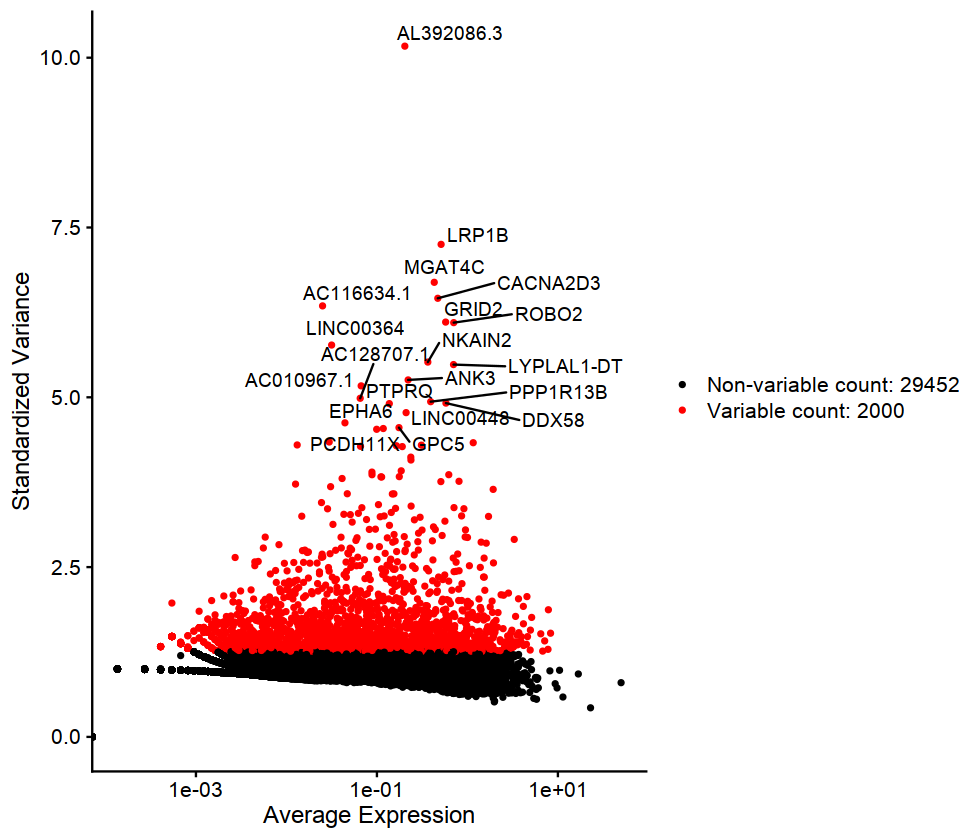

In [25]:
options(repr.plot.width = 8, repr.plot.height = 7)

# Identify the 10 most highly variable genes
topk <- head(VariableFeatures(rna), 20)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(rna)
plot2 <- LabelPoints(plot = plot1, points = topk, repel = T)
plot2

In [26]:
all.genes <- rownames(rna)
rna <- ScaleData(rna, features = all.genes)

Centering and scaling data matrix



In [27]:
rna <- RunPCA(rna, features = VariableFeatures(object = rna))

PC_ 1 
Positive:  MAP2, HS3ST5, HDAC2-AS2, AC099520.1, EDIL3, JAKMIP2, DOK6, THRB, GRIP1, CACNA2D1 
	   AC092957.1, THSD7A, PLAGL1, COL11A1, MCU, EFNA5, KCNQ5, PPM1E, KMT2C, FGD4 
	   CASC15, ASXL3, CACNA2D3, VAV2, ATP9B, FNDC3A, COBLL1, NFATC2, KLF3, AC073050.1 
Negative:  GREM1, SMURF2, UACA, COL1A1, FGF5, EXT1, FRMD6, VEGFC, HMGA2, CRIM1 
	   BNC2, THBS1, FN1, FMN1, FMN2, ITGA2, ADAMTS6, CHRM2, HMGA2-AS1, SFRP1 
	   NTM, RFX8, CFAP299, RBMS3, PRR16, AC009264.1, MYBL1, CDH13, MT2A, MIR31HG 
PC_ 2 
Positive:  GPC6, PDE4B, PARD3B, PCDH7, DOK6, ARHGAP18, ROBO1, PLCB1, FAM155A, SLC7A11 
	   IL1RAPL1, COL3A1, CDH6, SUPT3H, SOX5, MAP4K3, LPAR1, MEF2C, FAT4, JAKMIP2 
	   LYPLAL1-DT, EYA4, AC092957.1, COL11A1, PCDH15, CDH2, NEGR1, PCDH10, THSD7A, AL356124.1 
Negative:  CPAMD8, ZBTB46, COL9A3, TNNT1, SLC6A6, ATP2B4, NPTX1, PLCG2, TM4SF19, DSP 
	   IGFBP6, MKNK2, OBSCN, OCA2, TDRP, CPLX1, SLC6A8, CACNA2D3, HBA1, TNFAIP2 
	   H19, NFATC2, FSTL3, LRRFIP1, PTPRN2, MARVELD3, DNPEP, SNED1, MIAT, AL

In [28]:
make_pc_plot <- function(seurat_object, pc_x, pc_y, legend=T) {
    plot_df <- data.frame(pc_x=data.frame(Embeddings(seurat_object, reduction='pca'))[,sprintf("PC_%d", pc_x)],
             pc_y=data.frame(Embeddings(seurat_object, reduction='pca'))[,sprintf("PC_%d", pc_y)],
             sample=seurat_object$sample)
    plot_df = plot_df[sample(dim(plot_df)[1], 5000), ]

    p <- ggplot(plot_df) +
    geom_point(aes(x=pc_x, y=pc_y, color=factor(sample, levels=DAYS)), stroke=0, size=1) +
    theme_classic() +
    xlab(sprintf("PC_%d", pc_x)) + ylab(sprintf("PC_%d", pc_y)) +
    theme(plot.title = element_text(hjust = 0.5),
          text = element_text(size=12),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
    guides(colour = guide_legend(title="Day",
         override.aes = list(shape=16, alpha=1, size=4)))
    
    if (!legend) {
        p = p + theme(legend.position="none")
    }
    
    p
}

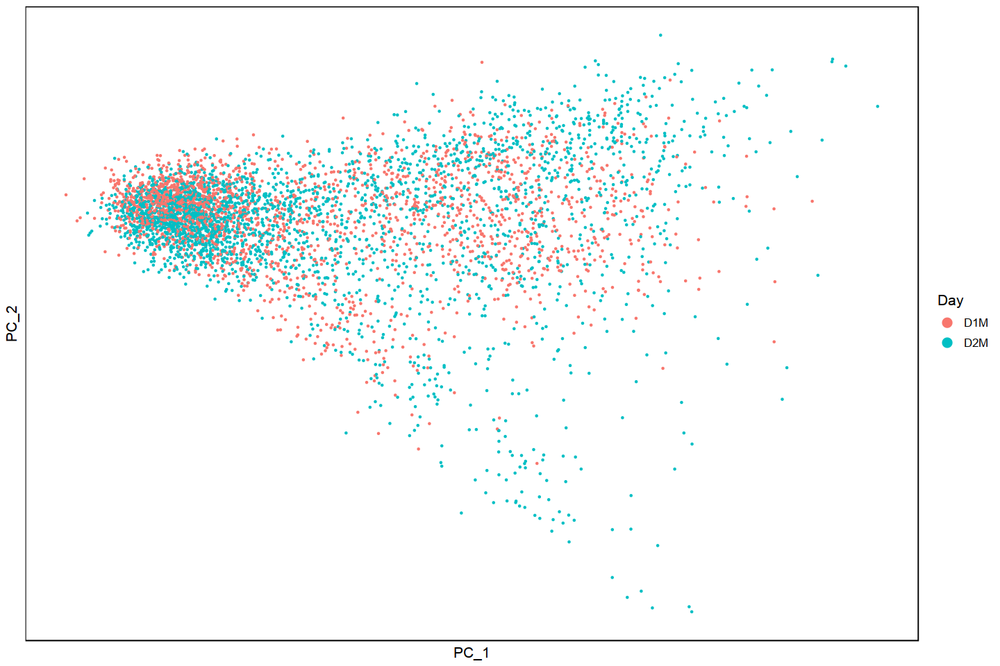

In [29]:
options(repr.plot.width = 12, repr.plot.height = 8)
make_pc_plot(rna, 1 ,2)

In [32]:
pc_plots = list()

for (i in seq(1,10)) {
    pc_plots[[2*i-1]] = make_pc_plot(rna, 2*i-1, 2*i, legend=F)
    pc_plots[[2*i]] = make_pc_plot(rna, 2*i, 2*i+1, legend=F)
}

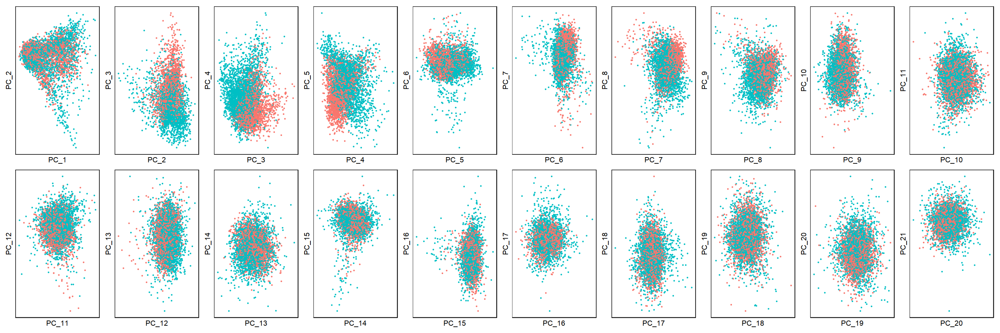

In [33]:
options(repr.plot.width = 24, repr.plot.height = 8)

wrap_plots(pc_plots, nrow=2)

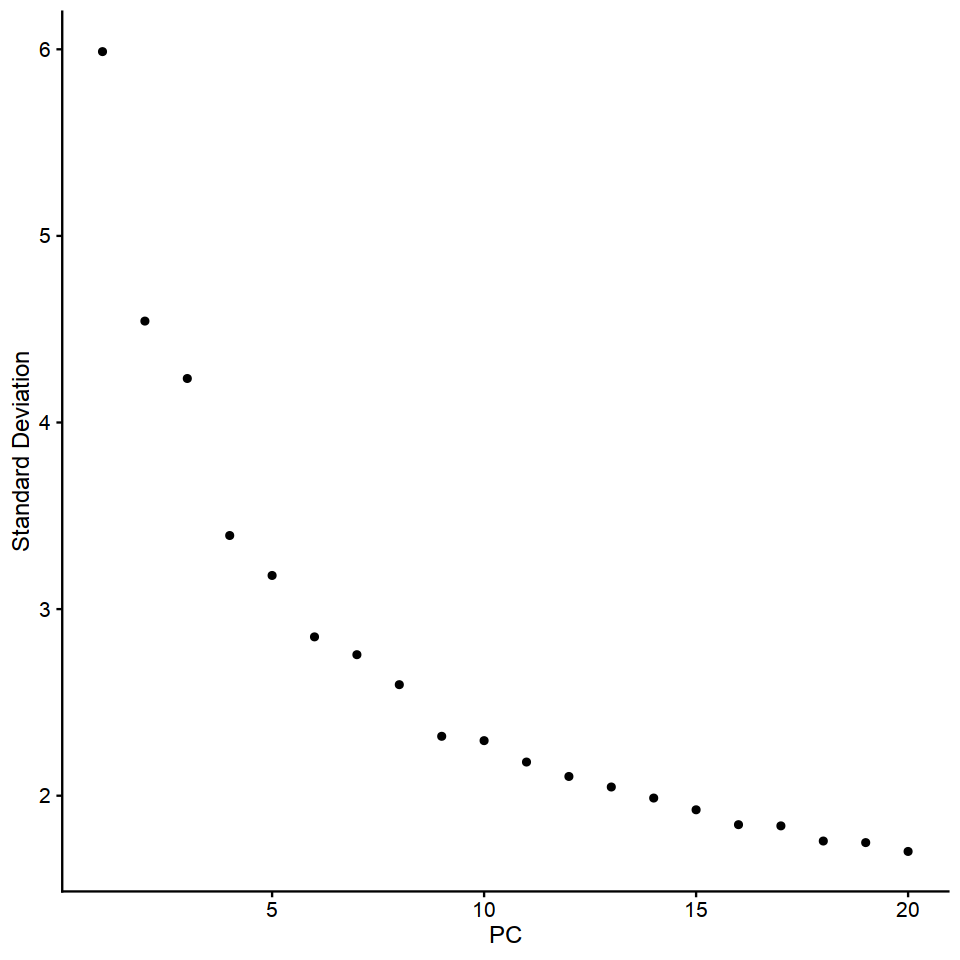

In [35]:
options(repr.plot.width = 8, repr.plot.height = 8)

ElbowPlot(rna)

### UMAP

In [36]:
rna <- RunUMAP(rna, dims = 1:10, seed.use = 1)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
03:35:35 UMAP embedding parameters a = 0.9922 b = 1.112

03:35:35 Read 7378 rows and found 10 numeric columns

03:35:35 Using Annoy for neighbor search, n_neighbors = 30

03:35:35 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

03:35:37 Writing NN index file to temp file /tmp/RtmpVzjPku/file27a4a5d0b133e

03:35:37 Searching Annoy index using 1 thread, search_k = 3000

03:35:40 Annoy recall = 100%

03:35:40 Commencing smooth kNN distance calibration using 1 thread

03:35:41 Initializing f

In [48]:
plot_df <- data.frame(pc1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1,
                 pc2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                 sample=rna@meta.data$sample)
plot_df = plot_df[sample(dim(plot_df)[1]), ]

by_day <- ggplot(plot_df) +
geom_point(aes(x=pc1, y=pc2, color=factor(sample, levels=DAYS)), stroke=0, size=1.3) +
theme_classic() +
xlab("UMAP 1") + ylab("UMAP 2") +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
guides(colour = guide_legend(title="Day",
     override.aes = list(shape=16, alpha=1, size=4))) + 
coord_fixed()

In [39]:
# plot_df <- data.frame(pc1=densmap[,1],
#                  pc2=densmap[,2],
#                  sample=rna_subset@meta.data$sample)
# plot_df = plot_df[sample(dim(plot_df)[1]), ]

# by_day_densmap <- ggplot(plot_df) +
# geom_point(aes(x=pc1, y=pc2, color=factor(sample, levels=DAYS)), stroke=0, size=1) +
# theme_classic() +
# scale_color_manual(values=day_config$colour) +
# xlab("DENSMAP 1") + ylab("DENSMAP 2") +
# theme(plot.title = element_text(hjust = 0.5),
#       text = element_text(size=12),
#       axis.line=element_blank(),
#       axis.text.x=element_blank(),
#       axis.text.y=element_blank(),
#       axis.ticks=element_blank(),
#       panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
# guides(colour = guide_legend(title="Day",
#      override.aes = list(shape=16, alpha=1, size=4))) +
# coord_fixed()

In [47]:
plot_df <- data.frame(pc1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1,
                 pc2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                 depth=log10(rna@meta.data$nCount_RNA))
plot_df = plot_df[sample(dim(plot_df)[1]), ]

by_depth <- ggplot(plot_df, aes(x=pc1, y=pc2, col=as.numeric(depth))) +
geom_point(stroke=0, size=1.3) +
theme_classic() +
scale_color_viridis_c() +
xlab("UMAP 1") + ylab("UMAP 2") +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
coord_fixed()

In [42]:
library(scales)

In [49]:
rna[["percent.oskm"]] = PercentageFeatureSet(rna, pattern="^(POU5F1|KLF4|MYC|SOX2)$")

plot_df <- data.frame(pc1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1,
                 pc2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                 oskm=rna@meta.data$percent.oskm)
plot_df = plot_df[sample(dim(plot_df)[1]), ]

by_oskm <- ggplot(plot_df, aes(x=pc1, y=pc2, col=(oskm))) +
geom_point(stroke=0, size=1.3) +
theme_classic() +
scale_color_viridis_c(limits=c(0,10), oob=squish) +
xlab("UMAP 1") + ylab("UMAP 2") +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
coord_fixed()

In [50]:
sum((rna@assays$RNA["POU5F1"]>0)&(rna@assays$RNA["KLF4"]>0)&(rna@assays$RNA["SOX2"]>0)&(rna@assays$RNA["MYC"]>0))

[1] 255

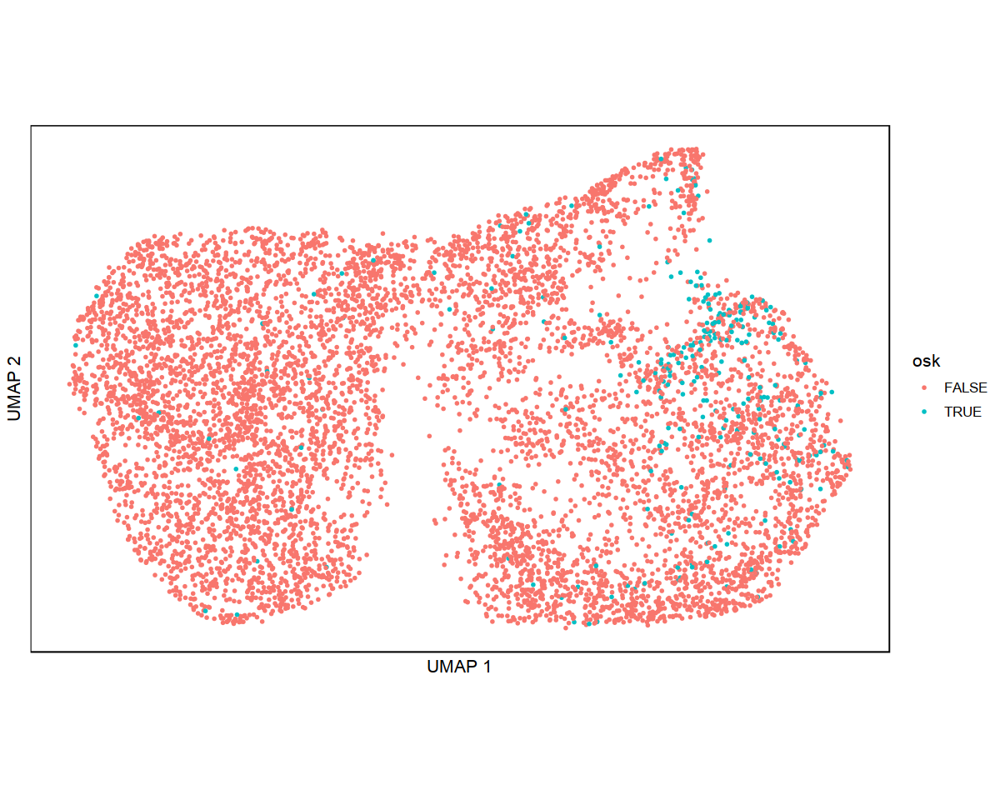

In [51]:
options(repr.plot.width = 10, repr.plot.height = 8)

plot_df <- data.frame(pc1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1,
                 pc2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                 osk=as.vector((rna@assays$RNA["POU5F1"]>0)&
                               (rna@assays$RNA["KLF4"]>0)&
                               (rna@assays$RNA["SOX2"]>0)&
                               (rna@assays$RNA["MYC"]>0)))
plot_df = plot_df[sample(dim(plot_df)[1]), ]

ggplot(plot_df, aes(x=pc1, y=pc2, col=osk)) +
geom_point(stroke=0, size=1.3) +
theme_classic() +
xlab("UMAP 1") + ylab("UMAP 2") +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
coord_fixed()

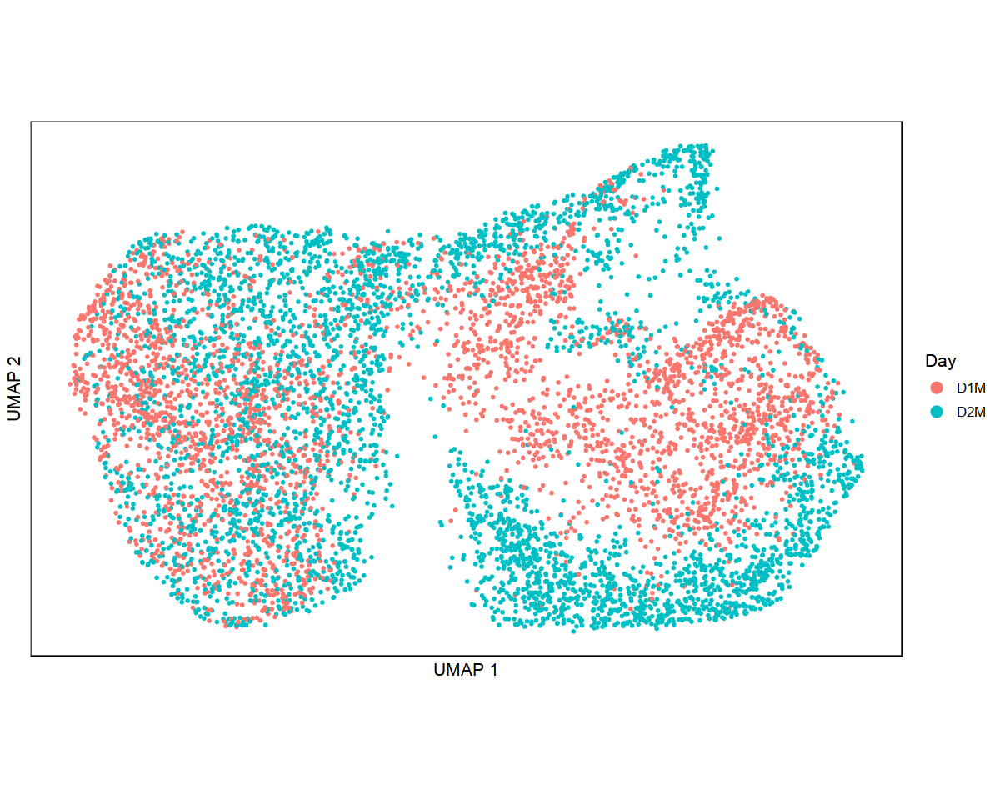

In [52]:
options(repr.plot.width = 10, repr.plot.height = 8)

by_day # | by_day_densmap

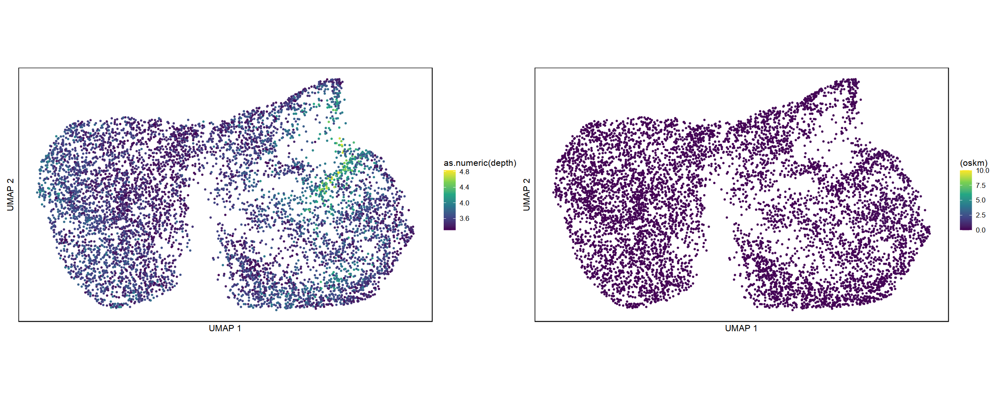

In [55]:
options(repr.plot.width = 20, repr.plot.height = 8)

by_depth | by_oskm

### Clusters

In [61]:
rna <- FindNeighbors(rna, dims = 1:10)
rna <- FindClusters(rna, resolution = .5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7378
Number of edges: 235053

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8396
Number of communities: 9
Elapsed time: 0 seconds


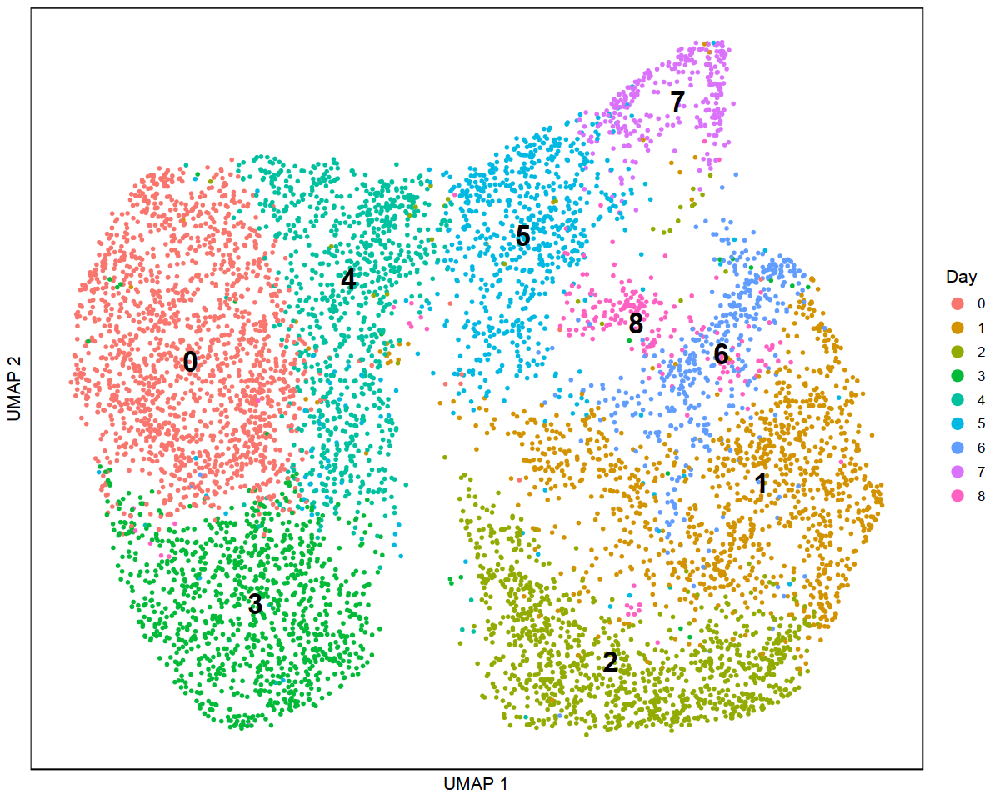

In [62]:
options(repr.plot.width = 10, repr.plot.height = 8)

plot_df <- data.frame(umap1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1,
                 umap2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                 cluster=rna@meta.data$seurat_clusters)
plot_df = plot_df[sample(dim(plot_df)[1]), ]

ggplot(plot_df) +
geom_point(aes(x=umap1, y=umap2, color=cluster), stroke=0, size=1.3) +
geom_text(data=data.frame(aggregate(plot_df[,c("umap1","umap2")], 
                            list(plot_df$cluster), median)),
         aes(x=umap1, y=umap2, label=Group.1), fontface = "bold", size=7) +
theme_classic() +
xlab("UMAP 1") + ylab("UMAP 2") +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
guides(colour = guide_legend(title="Day",
     override.aes = list(shape=16, alpha=1, size=4)))

In [81]:
markers <- FindAllMarkers(rna, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



In [129]:
cur_markers = markers %>% filter(cluster==7) %>% arrange(-avg_logFC)
dim(cur_markers)
head(cur_markers, 20)

[1] 547   7

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
AL392086.3,4.867309e-57,1.789920,0.305,0.063,1.530866e-52,7,AL392086.3
SLC6A62,1.396291e-118,1.592965,0.853,0.321,4.391615e-114,7,SLC6A6
AC099520.12,2.446150e-142,1.581728,0.781,0.189,7.693630e-138,7,AC099520.1
CACNA2D32,8.622887e-185,1.487656,0.627,0.088,2.712070e-180,7,CACNA2D3
OBSCN,1.390243e-253,1.366947,0.638,0.067,4.372593e-249,7,OBSCN
PLCG2,5.327289e-249,1.346832,0.588,0.055,1.675539e-244,7,PLCG2
TM4SF19,3.149315e-190,1.320744,0.581,0.073,9.905226e-186,7,TM4SF19
PDE10A,3.007469e-109,1.316735,0.416,0.063,9.459091e-105,7,PDE10A
ATP2B41,5.995330e-98,1.254151,0.961,0.608,1.885651e-93,7,ATP2B4


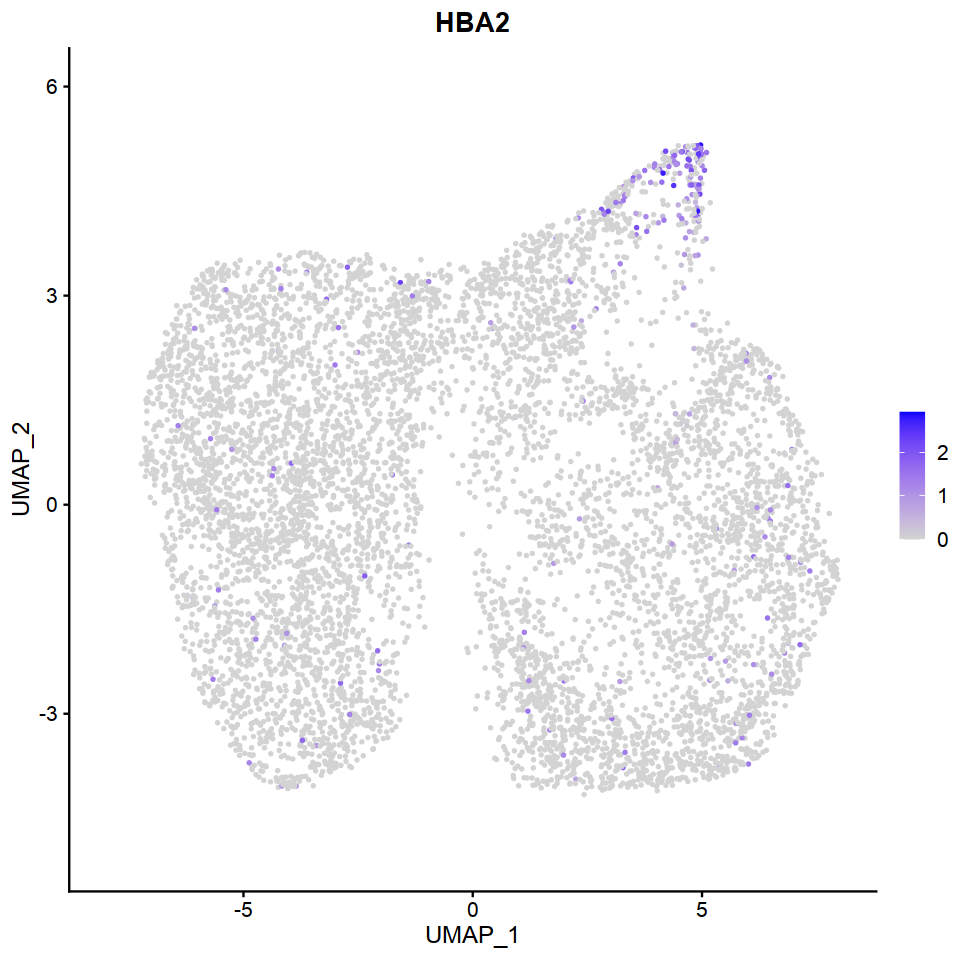

In [135]:
options(repr.plot.width = 8, repr.plot.height = 8)

FeaturePlot(rna, features = c("HBA2"), reduction = "umap", pt.size = 0.5, combine = FALSE)[[1]]

In [96]:
# write.table(cur_markers$gene, 
#             file="tmp.txt", row.names=F, quote=F, col.names=F)

## Gene Plots

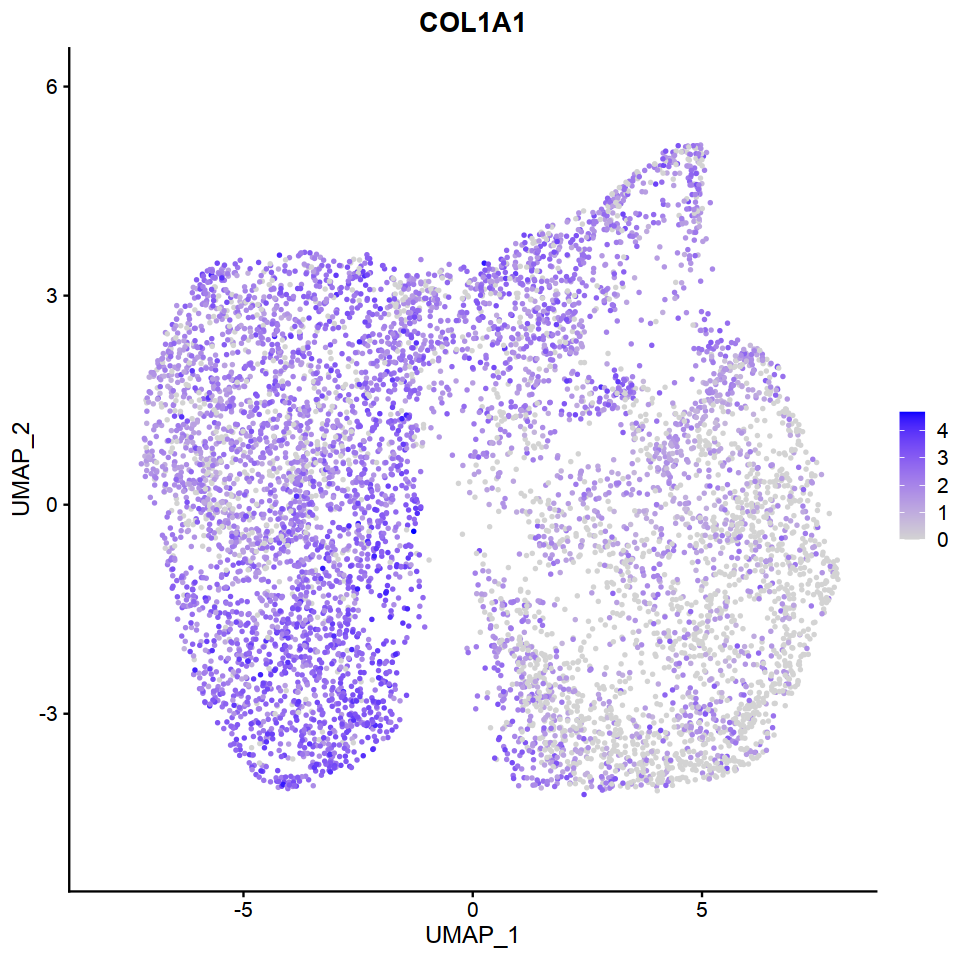

In [83]:
options(repr.plot.width = 8, repr.plot.height = 8)

FeaturePlot(rna, features = c("COL1A1"), reduction = "umap", pt.size = 0.5, combine = FALSE)[[1]]

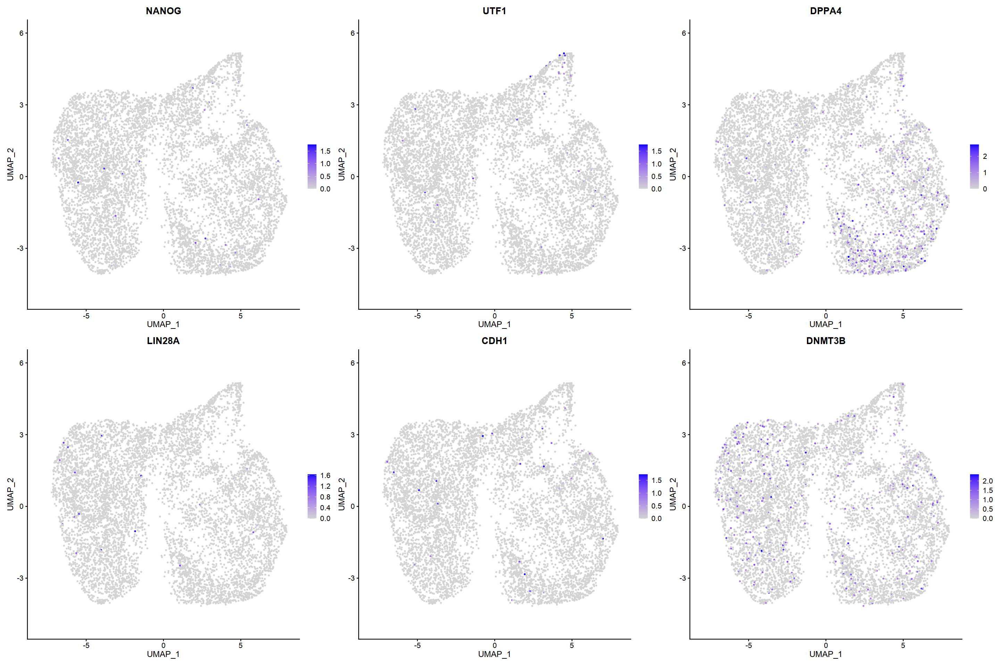

In [84]:
options(repr.plot.width = 24, repr.plot.height = 16)
# iPSC genes
plots = FeaturePlot(rna, features = c("NANOG", "UTF1", "DPPA4", "LIN28A", "CDH1", "DNMT3B" ), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=2)

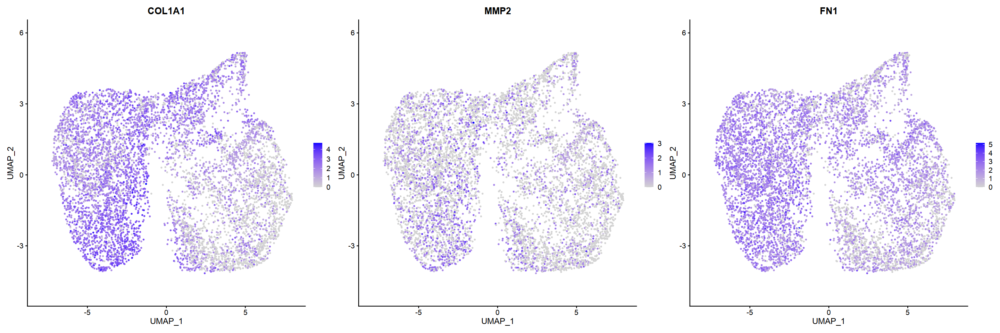

In [85]:
options(repr.plot.width = 24, repr.plot.height = 8)
# fibroblast genes
plots = FeaturePlot(rna, features = c("COL1A1", "MMP2", "FN1"), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=1)

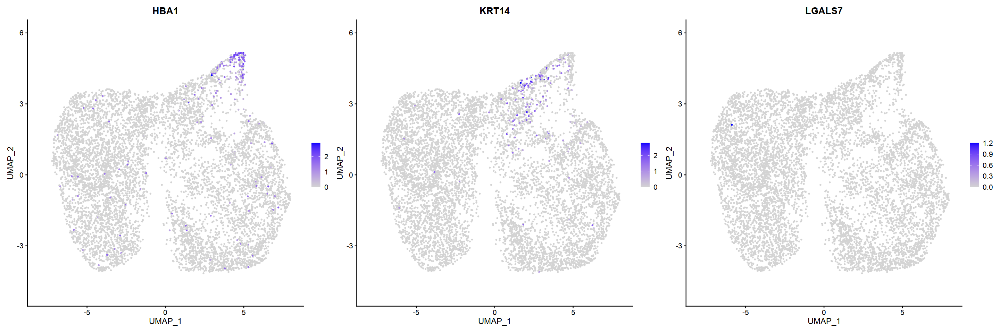

In [86]:
options(repr.plot.width = 24, repr.plot.height = 8)
# KLF4 target genes
plots = FeaturePlot(rna, features = c("HBA1", "KRT14", "LGALS7"), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=1)

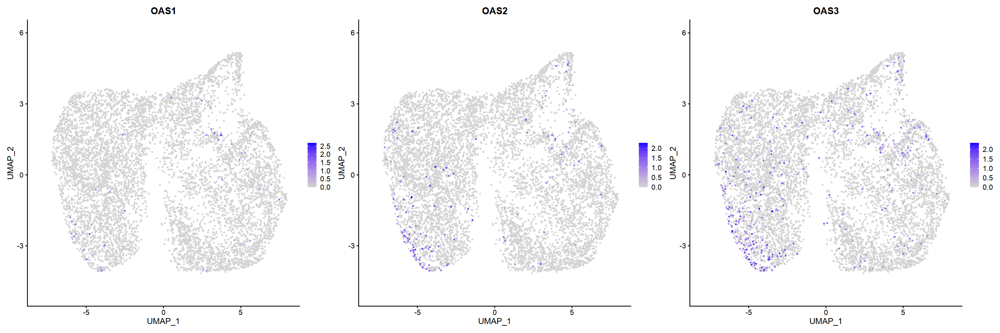

In [87]:
options(repr.plot.width = 24, repr.plot.height = 8)
# viral response
plots = FeaturePlot(rna, features = c("OAS1", "OAS2", "OAS3"), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=1)

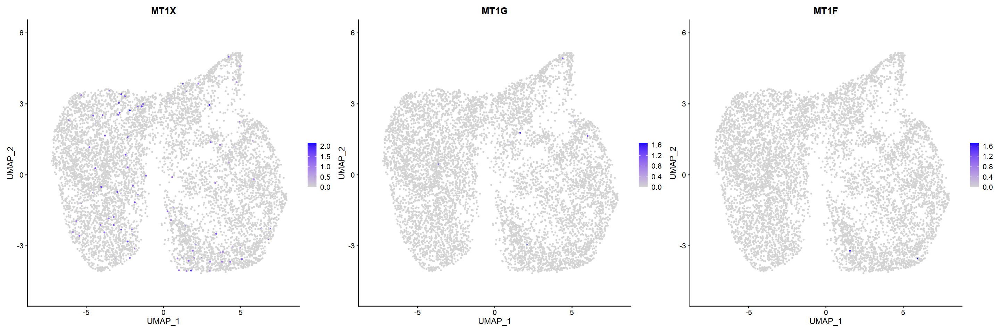

In [88]:
options(repr.plot.width = 24, repr.plot.height = 8)
# metallothioneins
plots = FeaturePlot(rna, features = c("MT1X", "MT1G", "MT1F"), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=1)

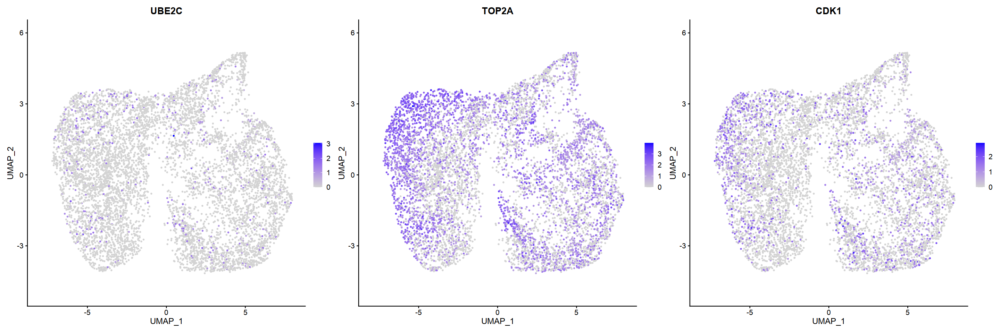

In [89]:
options(repr.plot.width = 24, repr.plot.height = 8)

# cell cycle factors
plots = FeaturePlot(rna, features = c("UBE2C", "TOP2A", "CDK1"), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=1)

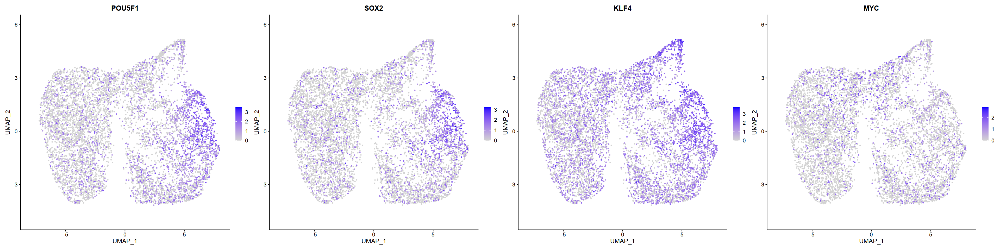

In [90]:
options(repr.plot.width = 32, repr.plot.height = 8)

# OSKM
plots = FeaturePlot(rna, features = c("POU5F1", "SOX2", "KLF4", "MYC"), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=1)

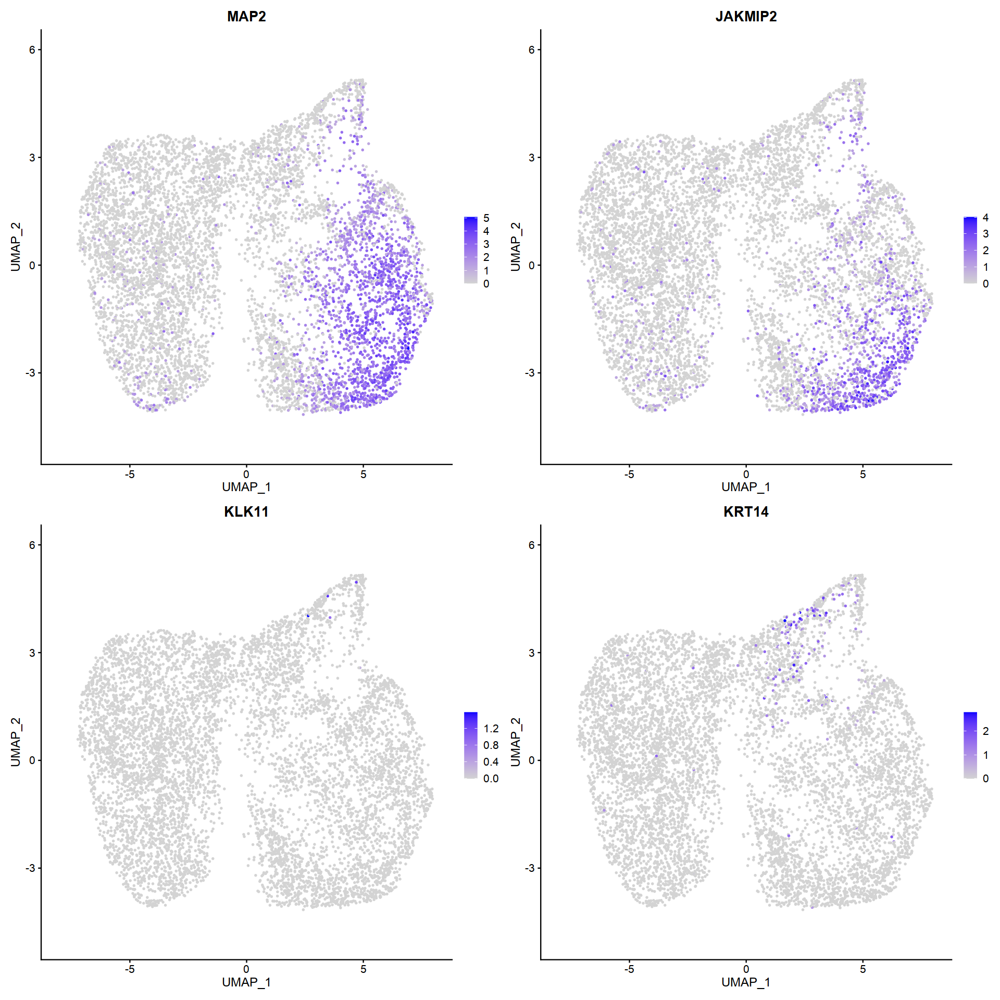

In [91]:
options(repr.plot.width = 16, repr.plot.height = 16)

plots = FeaturePlot(rna, features = c("MAP2", "JAKMIP2", "KLK11", "KRT14"), reduction = "umap", pt.size = 0.5, combine = FALSE)
wrap_plots(plots, nrow=2)

## Save RDS and h5ad 

In [107]:
saveRDS(rna, file=sprintf("./sessions/20220608_n%d/seurat.rds", dim(rna)[2]))

In [734]:
# library(sceasy)
# library(reticulate)
# loompy <- reticulate::import('loompy')

In [110]:
# sceasy::convertFormat(rna, from="seurat", to="anndata",
#                        outFile="./sessions/20210725_n59378/seurat.h5ad")

In [108]:
# gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,2504744,133.8,4032662,215.4,4032662,215.4
Vcells,379221284,2893.3,763897622,5828.1,751187057,5731.2


---

In [109]:
sessionInfo()

R version 3.6.3 (2020-02-29)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: Ubuntu 18.04.6 LTS

Matrix products: default
BLAS/LAPACK: /users/surag/anaconda3/envs/r36_cran/lib/libopenblasp-r0.3.9.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] scales_1.1.0    Matrix_1.2-18   patchwork_1.0.0 ggplot2_3.3.3  
[5] dplyr_1.0.2     Seurat_3.1.5   

loaded via a namespace (and not attached):
 [1] nlme_3.1-147        tsne_0.1-3          RcppAnnoy_0.0.16   
 [4] RColorBrewer_1.1-2  httr_1.4.1          repr_1.1.0         
 [7] sctransform_0.2.